In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as matplotlib
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
from datetime import datetime
import os
import gc
import json
from scipy.optimize import curve_fit
import datetime
from pathlib import Path

import plotly.express as px
from urllib.request import urlopen



In [52]:
# reference values 
PER_X = 100000
INFECTION_PERIOD = 14

In [2]:
pd.options.display.float_format = '{:,.3f}'.format
pd.set_option('display.max_columns', 50)

In [3]:
df = pd.read_csv('https://query.data.world/s/keax53lpqwffhayvcjmowjiydtevwo', parse_dates=['REPORT_DATE']).copy()

In [5]:
print("date range: {0} to {1}".format(df['REPORT_DATE'].min(), df['REPORT_DATE'].max()))

date range: 2019-12-31 00:00:00 to 2020-10-17 00:00:00


In [6]:
print(df.columns)

Index(['PEOPLE_POSITIVE_CASES_COUNT', 'COUNTY_NAME', 'PROVINCE_STATE_NAME',
       'REPORT_DATE', 'CONTINENT_NAME', 'DATA_SOURCE_NAME',
       'PEOPLE_DEATH_NEW_COUNT', 'COUNTY_FIPS_NUMBER', 'COUNTRY_ALPHA_3_CODE',
       'COUNTRY_SHORT_NAME', 'COUNTRY_ALPHA_2_CODE',
       'PEOPLE_POSITIVE_NEW_CASES_COUNT', 'PEOPLE_DEATH_COUNT'],
      dtype='object')


In [22]:
df_us = df[df['COUNTRY_ALPHA_2_CODE'] == 'US'].copy();
df_usp = df_us.groupby(['REPORT_DATE','PROVINCE_STATE_NAME']).sum()[
    [
        'PEOPLE_POSITIVE_CASES_COUNT', 
        'PEOPLE_POSITIVE_NEW_CASES_COUNT', 
        'PEOPLE_DEATH_COUNT', 
        'PEOPLE_DEATH_NEW_COUNT'
    ]
];
df_usp['MORTALITY_RATIO'] = df_usp['PEOPLE_DEATH_COUNT']/df_usp['PEOPLE_POSITIVE_CASES_COUNT'];
df_usp = df_usp.unstack().copy().drop('District of Columbia', level=1, axis=1);

df_statepop = pd.read_csv('/Users/dcripe/dev/code/notebooks/data_common/nst-est2019-alldata.csv').iloc[5::]

df_usppop = df_usp.iloc[-1].swaplevel(0,1).unstack().merge(df_statepop[['NAME','POPESTIMATE2019']], left_index=True, right_on='NAME').set_index('NAME')

df_states = pd.read_csv('/Users/dcripe/dev/code/notebooks/data_common/us_states.csv')

df_rinf_popadj_ansi = df_rinf_popadj.merge(df_states[['Subdivision name', 'Ansi']], left_index=True, right_on="Subdivision name" )

In [59]:
# calculate county level data

In [28]:
def clean_county_name(name):   
    toks = name.split()
    if toks[-1] in ['County', 'Area', 'Municipality','Parish']:
        return " ".join(toks[0:-1])
    else:
        return name

In [27]:
def make_fips(st, ct):
    return "{0:02d}{1:03d}".format(st, ct)

In [58]:
df_countypop = pd.read_csv('/Users/dcripe/dev/code/notebooks/data_common/co-est2019-alldata.csv', engine='python')

df_countypop['fips'] = df_countypop.apply(lambda x: make_fips(x['STATE'],x['COUNTY']), axis=1)

# extract NYC population since COVID dataset bundles all NYC counties as one location
nyc_pop = df_countypop[df_countypop['CTYNAME'].isin(['New York County','Kings County','Bronx County','Richmond County','Queens County'])]['POPESTIMATE2019'].sum()

df_countypop['CTYNAME_SHORT'] = df_countypop['CTYNAME'].apply(lambda x: clean_county_name(x))
df_countypop['STATE-COUNTY'] = df_countypop.apply(lambda x: "{0}, {1}".format(x['CTYNAME_SHORT'],x['STNAME']), axis=1)

df_us['STATE-COUNTY'] = df_us.apply(lambda x: "{0}, {1}".format(x['COUNTY_NAME'],x['PROVINCE_STATE_NAME']), axis=1)

df_uscp = df_us.groupby(['REPORT_DATE','STATE-COUNTY']).sum()[
    [
        'PEOPLE_POSITIVE_CASES_COUNT', 
        'PEOPLE_POSITIVE_NEW_CASES_COUNT', 
        'PEOPLE_DEATH_COUNT', 
        'PEOPLE_DEATH_NEW_COUNT'
    ]
].unstack().copy()

df_uscppop = df_uscp.iloc[-INFECTION_PERIOD::].sum().swaplevel(0,1).unstack().merge(df_countypop[['STATE-COUNTY','REGION','DIVISION','STNAME','CTYNAME_SHORT','fips','POPESTIMATE2019']], left_index=True, right_on='STATE-COUNTY').set_index('STATE-COUNTY')

df_uscppop['14D_CASES_POP_ADJ'] = (df_uscppop['PEOPLE_POSITIVE_NEW_CASES_COUNT']/df_uscppop['POPESTIMATE2019']*PER_X)
df_uscppop['14D_DEATHS_POP_ADJ'] = (df_uscppop['PEOPLE_DEATH_NEW_COUNT']/df_uscppop['POPESTIMATE2019']*PER_X)

df_uscppop['label'] = df_uscppop.apply(lambda x: "{0} (pop: {1:,})".format(x.CTYNAME_SHORT,x.POPESTIMATE2019), axis=1)

# Infection heatmaps

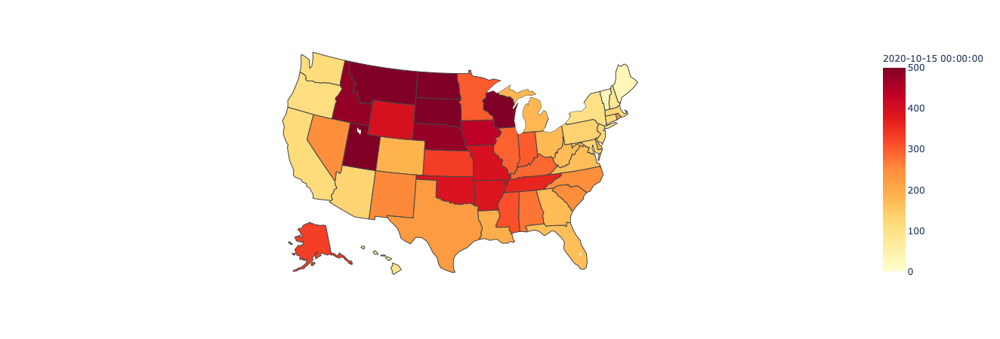

In [57]:
fig = px.choropleth(
    df_rinf_popadj_ansi,
    locations="Ansi", 
    locationmode="USA-states", 
    color=df_rinf_popadj_ansi.columns[-3],       
    color_continuous_scale="YlOrRd",
    range_color=(0, 500),    
    scope="usa",
    labels={df_rinf_popadj_ansi.columns[-3]:'Current cases per {0:,} people'.format(PER_X)},
)
fig.show()

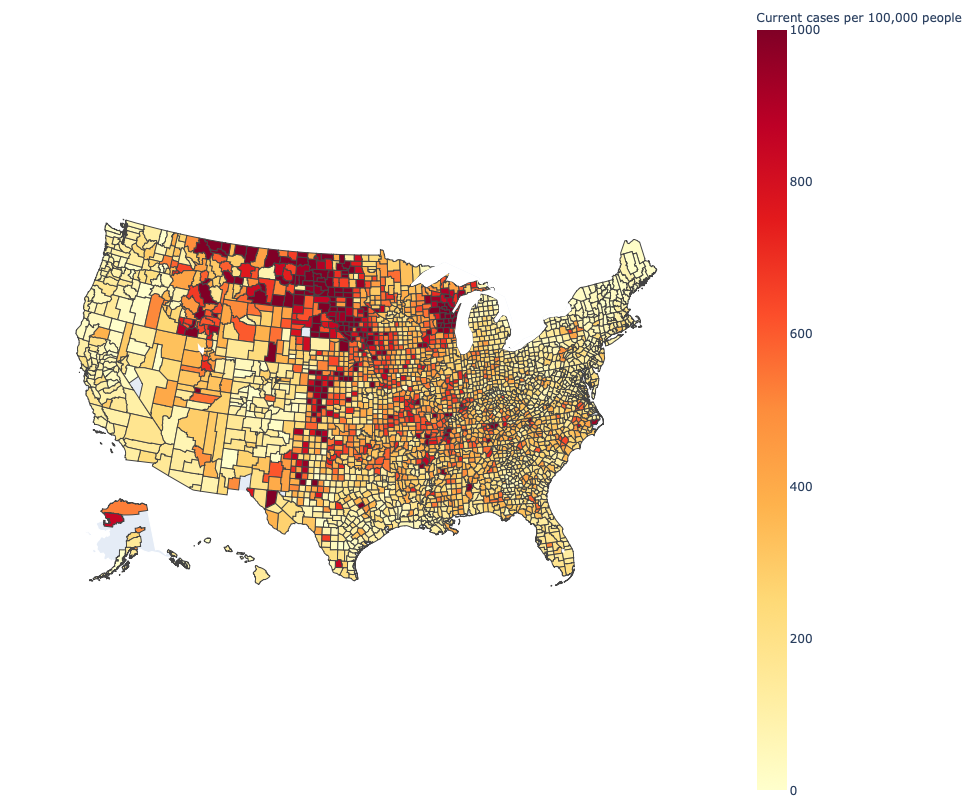

In [48]:
from urllib.request import urlopen
import json
import plotly.express as px

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth(
    df_uscppop, 
    geojson=counties, 
    locations='fips', 
    color='14D_CASES_POP_ADJ',       
    color_continuous_scale="YlOrRd",
#     color_continuous_scale="matter",
    range_color=(0, 1000),
#     color_continuous_midpoint=(250),
    scope="usa",
    labels={
        '14D_CASES_POP_ADJ':'Current cases per {0:,} people'.format(PER_X), 
#         "POPESTIMATE2019":"Polulation",
    },
    hover_name='label',
    width=1200, 
    height=800,
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
fig.write_image('./out/covid_inf_per_100k_us_map.png')

# Infection Prevalence / Risk

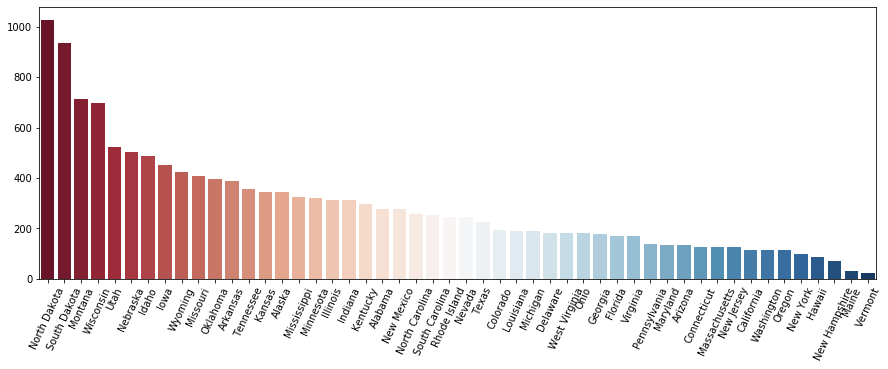

In [73]:
data = (df_per['PEOPLE_POSITIVE_NEW_CASES_COUNT']/df_per['POPESTIMATE2019']*PER_X).sort_values(ascending=False);
# data
fig, ax = plt.subplots();
fig.set_size_inches(15, 5);
sns.barplot(x=data.index.values, y=data, palette="RdBu", ax=ax)
plt.xticks(rotation=65);

In [53]:
df_per = df_usp.iloc[-INFECTION_PERIOD::].sum().swaplevel(0,1).unstack().merge(df_statepop[['NAME','POPESTIMATE2019']], left_index=True, right_on='NAME').set_index('NAME')


creating 10x5 figure for dates 2020-01-21 00:00:00 - 2020-10-15 00:00:00
(10, 5)


/Users/dcripe/.local/lib/python3.7/site-packages/ipykernel_launcher.py:51: UserWarning:

constrained_layout not applied.  At least one axes collapsed to zero width or height.

/Users/dcripe/.local/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning:

constrained_layout not applied.  At least one axes collapsed to zero width or height.



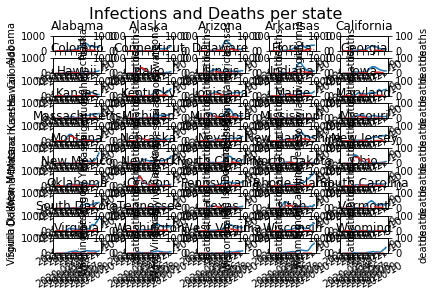

In [105]:
df_rinf = df_usp.xs('PEOPLE_POSITIVE_NEW_CASES_COUNT', axis=1, level=0).rolling(window=INFECTION_PERIOD).sum().T.merge(
    df_statepop[['NAME','POPESTIMATE2019']], left_index=True, right_on='NAME').set_index('NAME')
df_rinf_popadj = (df_rinf[df_rinf.columns[0:-2]].div(df_rinf[df_rinf.columns[-1]], axis=0)*PER_X)

df_rmor = df_usp.xs('PEOPLE_DEATH_NEW_COUNT', axis=1, level=0).rolling(window=INFECTION_PERIOD).sum().T.merge(
    df_statepop[['NAME','POPESTIMATE2019']], left_index=True, right_on='NAME').set_index('NAME')
df_rmor_popadj = (df_rmor[df_rmor.columns[0:-2]].div(df_rmor[df_rmor.columns[-1]], axis=0)*PER_X)


date_range = pd.date_range(
    df_rinf_popadj.columns[0], 
    df_rinf_popadj.columns[-1],
)

cols = 5
rows = 10
print("creating {0}x{1} figure for dates {2} - {3}".format(rows, cols, date_range[0], date_range[-1]))

fig, axs = plt.subplots(
    rows, 
    cols, 
#     figsize=(25, 4 * rows), 
    gridspec_kw={'wspace':0.5,'hspace':0.5},
    constrained_layout=True,
)
print(axs.shape)
for rnum in range(rows):
    for cnum in range(cols):
        idx = (rnum * cols) + cnum
        x = date_range.values
        state = df_rinf_popadj.index[idx]
        y = df_rinf_popadj.iloc[idx]

        ax = axs[rnum, cnum]
        ax.plot(x, y, color='tab:blue', linestyle='{0}'.format('-'))

        ax.set_ylim(bottom=0, top=1000)
        ax.set_ylabel(state)
        ax.set(title='{0}'.format(state))
        for tick in ax.get_xticklabels():
            tick.set_rotation(30)
            
        ax2 = ax.twinx()
        ax2.plot(x, df_rmor_popadj.iloc[idx], color='tab:red', linestyle='-.')
        ax2.set_ylabel('deaths')
        ax2.set_ylim(bottom=0, top=100)
        
fig.suptitle('Infections and Deaths per state', fontsize=16)
# plt.subplots_adjust(hspace=0.30, wspace=0.25)

plt.savefig('./out/covid_inf_per_100k_us.png')

# Population Impact

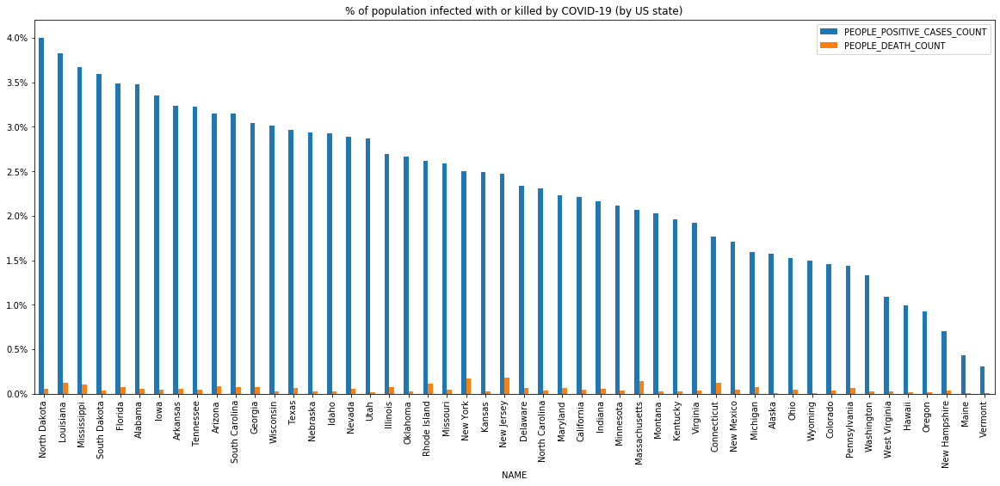

In [16]:
ax = df_usppop[df_usppop.columns[0:4]].div(df_usppop['POPESTIMATE2019'], axis=0)[['PEOPLE_POSITIVE_CASES_COUNT','PEOPLE_DEATH_COUNT']].sort_values(ascending=False, by='PEOPLE_POSITIVE_CASES_COUNT')[0:50].plot.bar(
    figsize=(20,8), 
    title="% of population infected with or killed by COVID-19 (by US state)",
#     stacked=True,
#     logy=True
#     icons='child', 
#     icon_size=18, 
#     icon_legend=True,
);
vals = ax.get_yticks();
ax.set_yticklabels(['{:,.1%}'.format(x) for x in vals]);

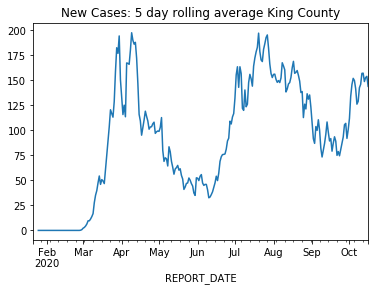

In [45]:
df_uscp.xs("King, Washington", axis=1, level=1)['PEOPLE_POSITIVE_NEW_CASES_COUNT'].rolling(window=5).mean().plot.line(title="New Cases: 5 day rolling average King County")

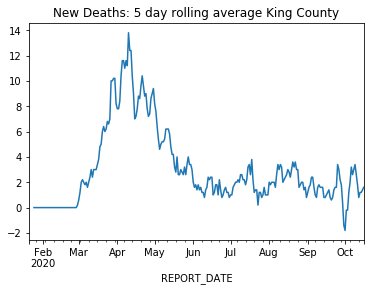

In [46]:
df_uscp.xs("King, Washington", axis=1, level=1)['PEOPLE_DEATH_NEW_COUNT'].rolling(window=5).mean().plot.line(title="New Deaths: 5 day rolling average King County")

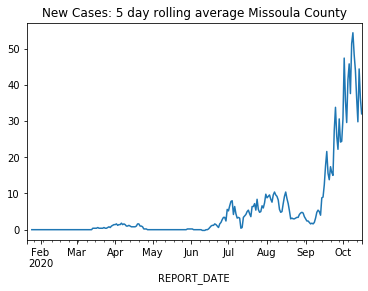

In [47]:
df_uscp.xs("Missoula, Montana", axis=1, level=1)['PEOPLE_POSITIVE_NEW_CASES_COUNT'].rolling(window=5).mean().plot.line(title="New Cases: 5 day rolling average Missoula County")